In [2]:
# Предварительные настройки отображения вынесены в отдельный модуль
# plotting_settings.py
import plotting_settings
plotting_settings.set_mpl()

# Библиотеки для построения графиков
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Библиотека для работы с табличными данными
import pandas as pd

# Библиотеки для отображения интерактивной карты федеральных округов
# (сделано на основе https://github.com/hairymax/offline_russia_plotly)
from ru_graduates.map_figure import mapFigure
import plotly.express as px

# Дополнительные настройки отображения
import plotly.io as pio
pio.renderers.default = "notebook"
from IPython.display import display

# Библиотека для продвинутых операций с коллекциями
import itertools

# Библиотека для расширенного документирования типов аргументов функций
from typing import Callable, Any

## Данные

Данные о трудоустройстве и зарплатах выпускников российских организаций среднего специального и высшего образования по направлениям подготовки и уровням образования. Данные о трудоустройстве и приведены по состоянию на __31.12.2023__, о зарплате — за __12 месяцев 2023 года.__

__Источник__: Роструд, __обработка__: «Если быть точным»

В датасете нас будут интересовать:

- наименование региона или федерального округа
- направление подготовки (специализация)
- средняя зарплата
- пол выпускника

<font color="gray">Трудоустройство и зарплаты выпускников по направлениям подготовки//Роструд; обработка «Если быть точным», 2024. Условия использования: Creative Commons BY 4.0. URL: https://tochno.st/datasets/graduates_fields</font>

<details>
    <summary>Пропуски в данных</summary>

In [3]:
# Загружаем датасет
data_path = (
    'data/data_graduates_specialty_125_v20240709_csv/'
    'data_graduates_study_area_125_v20240611.csv'
    )
smaller_df = pd.read_csv(data_path, sep=';')

# Создаем выборки без разделения по полу
fed_dist_bachelor_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Бакалавриат, специалитет" &'
    'gender == "Всего"'
    )

fed_dist_master_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Магистратура" &'
    'gender == "Всего"'
    )

# Исследуем пропуски
for column, n_empty in fed_dist_master_df.isna().sum().items():
    if n_empty > 0:
        print(
            f'Для выпускников магистратуры в данных о зарплате пропущено '
            f'{n_empty} из {len(fed_dist_master_df)} значений'
            f' ({n_empty / len(fed_dist_master_df):.0%})'
            )
        
fed_dist_master_df[fed_dist_master_df['average_salary'].isna()][
    ['object_name', 'study_area', 'average_salary']
    ].sort_values('study_area', ascending=True).reset_index(drop=True)

Для выпускников магистратуры в данных о зарплате пропущено 8 из 307 значений (3%)


,object_name,study_area,average_salary
0,Южный федеральный округ,Здравоохранение и медицинские науки,NaN
1,Южный федеральный округ,Здравоохранение и медицинские науки,NaN
2,Южный федеральный округ,Здравоохранение и медицинские науки,NaN
3,Приволжский федеральный округ,Здравоохранение и медицинские науки,NaN
4,Уральский федеральный округ,Здравоохранение и медицинские науки,NaN
5,Уральский федеральный округ,Здравоохранение и медицинские науки,NaN
6,Дальневосточный федеральный округ,Здравоохранение и медицинские науки,NaN
7,Северо-Кавказский федеральный округ,Искусство и культура,NaN


</details>

<div class="alert alert-light" role="alert">🔎 На карте ниже можно узнать, к каким федеральным округам (ФО) относятся разные области России: </div>

In [4]:
#| column: screen-inset-right
# Загружаем подготовленную заранее карту
# (сделано на основе https://github.com/hairymax/offline_russia_plotly)
russia_map = mapFigure()
regions = pd.read_parquet("data/regions/russia_regions.parquet")

# Окрашиваем федеральные округа в разные цвета
fo_list = list(regions['federal_district'].unique())
colors = px.colors.qualitative.Pastel1
for i, r in regions.iterrows():
    text = f'<b>{r.federal_district} ФО<br></b>{r.region}'
    russia_map.update_traces(selector=dict(name=r.region),
        text=text,
        fillcolor=colors[fo_list.index(r.federal_district)])
russia_map.show()

***

Посмотрим, выпускники каких специальностей зарабатывают больше всего в разных федеральных округах. В топах представлены выпускники следующих спецальностей:

<img src="./data/img/engineer.png" width="25"/> <font color="#1E88E5">инженерных и технических</font>

<img src="./data/img/nerd.png" width="25"/> <font color="#ff0d57">математических и естестеннонаучных</font>

<img src="./data/img/doctor.png" width="25"/> <font color="#13B755">медицинских</font>

<img src="./data/img/social.png" width="25"/> <font color="#FFC000">общественно-научных</font>

<img src="./data/img/rural.png" width="25"/> <font color="#7C52FF">сельскозозяйственных</font>

<img src="./data/img/art.png" width="25"/> <font color="#00AEEF">искусство/культура</font>

::: {.callout-note}
## Ограничения

В датасете есть информация о выпускниках разных лет — с 2019 по 2023. Размеры выборки не позволяют ограничиться только самыми свежими данными и замерять значения метрик, например, по отдельным федеральным округам и специальностям. На графике ниже информация о выпускниках разных лет усреднена для исследования крупных трендов.
:::

In [5]:
def format_yticks(value: float, _: Any):
    '''
    Преобразует значения по выбранной оси в удобный формат
    (150000 -> 150К). Пример использования:
    
    ax.yaxis.set_major_formatter(plt.FuncFormatter(format_yticks))

    Args:
        value (float): Значение, которое требуется преобразовать
        _ (Any): Формальный аргумент, никак не использоется, но требуется в
        plt.FuncFormatter()

    Returns:
        str: Преобразованное значение
    '''    
    if value >= 1000:
        return f'{int(value/1000)}K'
    else:
        return f'{int(value)}'


def plot_top_salaries_by_fd(df: pd.DataFrame, no_med: bool = False):
    '''
    Строит столбчатые диаграммы по отдельным федеральным округам.
    Для каждого округа строится топ-3 направлений образования по среднему
    размеру зарплат.

    Args:
        df (pd.DataFrame): Датафрейм, содержащий информацию о зарплатах по
        разным направлениям образования в разных округах
        no_med (bool, optional): Флаг, который позволяет исключить выпускников
        медицинских специальностей из рассмотрения (подробности ниже).
        По-умолчанию False.
    '''

    if no_med:
        # Исключаем выпускников медицинских специальностей из рассмотрения
        df = df.query('study_area != "Здравоохранение и медицинские науки"')

    # Названия федеральных округов
    unique_objects = df['object_name'].unique()

    # Настраиваем сетку графиков (2 строки на 4 столбца)
    fig, axes = plt.subplots(2, 4, figsize=(8, 7))
    axes = axes.flatten()  # Делаем сетку "плоской" для упрощения итерации

    # Задаем цвета для разных направлений образования
    color_dict = {
    'Инженерное дело, технологии и технические науки': "#1E88E5",
    'Здравоохранение и медицинские науки': "#13B755",
    'Математические и естественные науки': "#ff0d57",
    'Сельское хозяйство и сельскохозяйственные науки': "#7C52FF",
    'Науки об обществе': "#FFC000",
    'Искусство и культура': "#00AEEF",
    'Образование и педагогические науки': "C2"
    }

    # Ставим в соответствие каждому направлению образования заранее подготовленные
    # файлы изображений с эмодзи. Они нужны для экономии места на графике
    # (чтобы можно было не подписывать значения по горизонтальной оси)
    emoji_dict = {
    'Инженерное дело, технологии и технические науки': 'engineer',
    'Здравоохранение и медицинские науки': 'doctor',
    'Математические и естественные науки': 'nerd',
    'Сельское хозяйство и сельскохозяйственные науки': 'rural',
    'Науки об обществе': 'social',
    'Искусство и культура': 'art',
    'Образование и педагогические науки': 'books'
    }

    for ax_index, fed_dist in enumerate(unique_objects):
        if ax_index >= len(axes):
            # На случай, если объектов для итерации больше, чем графиков в сетке
            break

        fed_df = df.query(f'object_name == "{fed_dist}"')
        
        fed_stat_df = (
            # Группируем датасет по направлениям образования и считаем
            # медианное значение зарплаты в каждой группе
            fed_df.groupby('study_area')['average_salary'].median()
            # Оставляем только топ-3 специальностей по уровню зарплат
            .nlargest(3)
        ).reset_index()

        # Выбираем график для построения диаграммы в заданном округе
        ax = axes[ax_index]

        # Делаем значения по осям полупрозрачными на всех графиках,
        # кроме крайних левых
        if ax_index not in [0, 4]:
            for label in ax.get_yticklabels():
                label.set_alpha(0.5)
        
        # Создаем колонку с кодами цветов для каждой специальности
        fed_stat_df['color'] = fed_stat_df['study_area'].map(color_dict)

        # Строим диаграмму
        sns.barplot(
            x='study_area', y='average_salary', data=fed_stat_df, ax=ax,
            hue='color', palette=fed_stat_df['color'].tolist(),
            legend=False, alpha=0.7
        )
        
        # Наносим название округа на выбранный график
        ax.set_title(
            fed_dist.replace('федеральный округ', ''), fontsize=16, y=1.05, x=0.7
            )
        # Устанавливаем диапазон по вертикальной оси
        ax.set_ylim(0, 1.7e5)

        # Избавляемся от избыточных пометок на графике
        ax.set_ylabel('')
        ax.set_xlabel('')

        # Размещаем соответствующее изображение с эмодзи сверху каждого
        # столбика диаграммы
        for i, bar in enumerate(ax.patches):
            # Координаты для размещения эмодзи
            x0 = bar.get_x() + bar.get_width() / 2.0 # По центру столбика
            y0 = bar.get_height() # Сверху столбика

            # Формируем название эмодзи для считывание
            bar_legend = fed_stat_df.iloc[i].study_area
            image_file = f'{emoji_dict.get(bar_legend)}.png'
            # Считываем изображение с эмодзи
            image = plt.imread(f'data/img/{image_file}')
            image_box = OffsetImage(image, zoom=0.15)
            # Размещаем эмодзи на графике
            ab = AnnotationBbox(
                image_box, (x0, y0), frameon=False, xycoords='data',
                box_alignment=(0.5, 0.0)
                )
            ax.add_artist(ab)

            # Избавляемся от избыточных надписей
            ax.tick_params(axis='x', bottom=False)
            ax.set_xticklabels([])

            # Преобразуем подписи осей в удобный формат
            ax.yaxis.set_major_formatter(plt.FuncFormatter(format_yticks))


        # Добавляем подписи осей, общие для всей сетки графиков
        fig.text(
            0.5, 0.005, 'Специальность выпускника', ha='center', va='center',
            fontsize=20, fontweight='bold'
            )
        fig.text(
            0.001, 0.45, 'Средняя зарплата (рубли)', ha='center', va='center',
            fontsize=20, fontweight='bold', rotation=90
            )

    # Сокращаем размер рамки
    plt.tight_layout()
    plt.show()

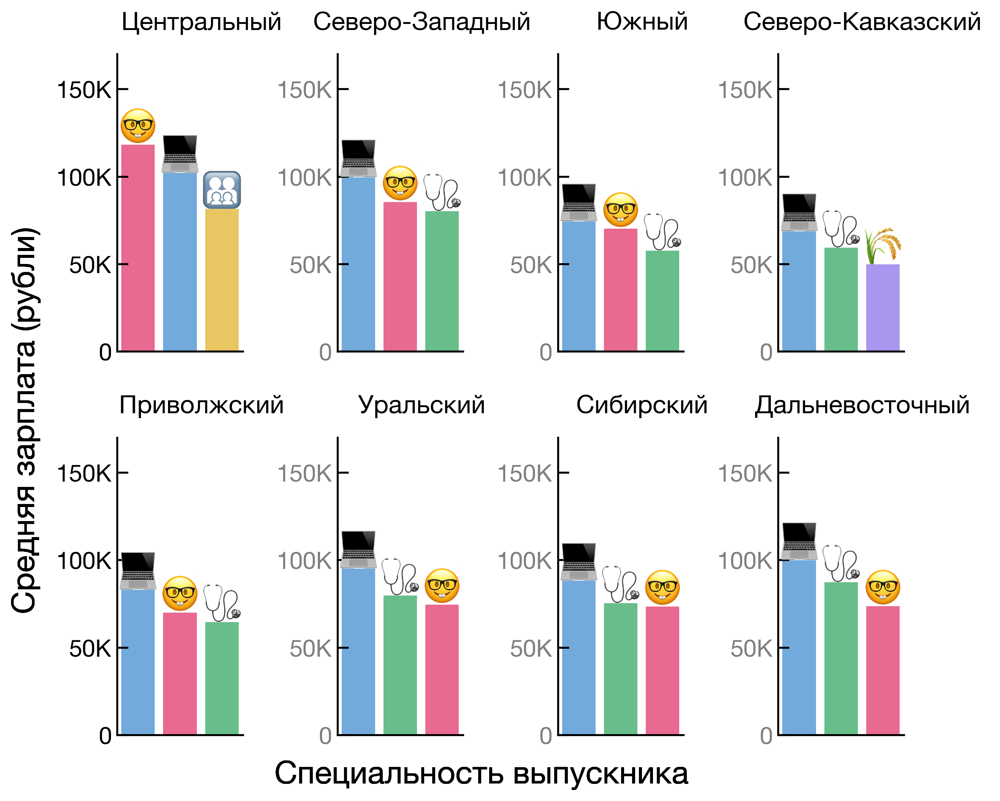

In [6]:
plot_top_salaries_by_fd(fed_dist_bachelor_df)

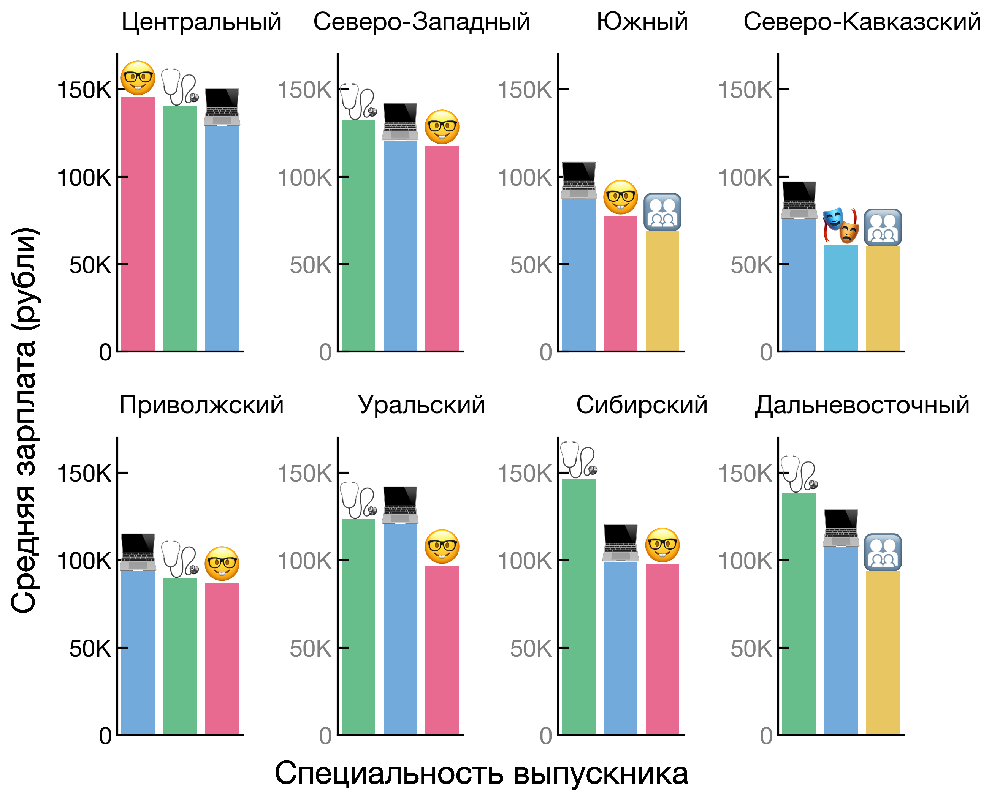

In [7]:
plot_top_salaries_by_fd(fed_dist_master_df)

<span style="font-size: 20px;">Подозрительные особенности</span>

- Аномально большой прирост зарплаты наблюдается у выпускников <img src="./data/img/doctor.png" width="20"/> <font color="#13B755"> медицинских </font> специальностей, особенно он заметен в Сибирском и Дальневосточном округах

- Магистры <img src="./data/img/doctor.png" width="20"/> <font color="#13B755"> медицинских </font> специальностей не входят в топ-3 по уровню зарплат в Южном и Северо-Кавказском округах, _скорее всего связано с пропусками в данных_

## Пропуски в данных

В Южном и Северо-Кавказском округах отсутствует информация о зарплате магистров медицинских наук:

In [8]:
# Посмотрим, как выглядят данные о зарплатах выпускников медицинских специальностей
# в Южном ФО и Северо-Кавказском ФО
df1 = pd.DataFrame(fed_dist_bachelor_df.query(
    'object_name == "Южный федеральный округ"'
    '& study_area == "Здравоохранение и медицинские науки"'
    )['average_salary'])

df2 = pd.DataFrame(fed_dist_master_df.query(
    'object_name == "Южный федеральный округ"'
    '& study_area == "Здравоохранение и медицинские науки"'
    )['average_salary'])

df3 = pd.DataFrame(fed_dist_bachelor_df.query(
    'object_name == "Северо-Кавказский федеральный округ"'
    '& study_area == "Здравоохранение и медицинские науки"'
    )['average_salary'])

df4 = pd.DataFrame(fed_dist_master_df.query(
    'object_name == "Северо-Кавказский федеральный округ"'
    '& study_area == "Здравоохранение и медицинские науки"'
    )['average_salary'])

In [9]:
#| label: tbl-ref
#| tbl-cap: "Южный федеральный округ"
#| tbl-subcap:
#|  - "Бакалавры/специалисты"
#|  - "Магистры"
#| layout-ncol: 2
#| echo: fenced

display(df1)
display(df2)

,average_salary
3122,72838.30634
3130,70779.21762
3138,57534.04568
3146,48477.49281
3154,41583.38503


,average_salary
3169,NaN
3177,NaN
3185,NaN


In [10]:
#| label: tbl-ref-2
#| tbl-cap: "Северо-Кавказский федеральный округ"
#| tbl-subcap:
#|  - "Бакалавры/специалисты"
#|  - "Магистры (нет записей)"
#| layout-ncol: 2
#| echo: fenced

display(df3)
display(df4)

,average_salary
3265,68271.08231
3273,64426.35973
3281,59316.38948
3289,50192.02503
3297,43859.00063


,average_salary


Комментарий Алены Манузиной (_«Если быть точным»_):

> По федеральным округам — надо проверять, но учитывая размер набора, __можно предположить, что в ЮФО и СКФО медицинской магистратуры просто нигде нет__. Если верить этим [товарищам](https://postupi.online/programmy-obucheniya/magistratura/razdel-medicina-i-zdravoohranenie/?ysclid=m018bo4gav132603698), такая магистратура есть в Москве, СПб, Казани, Томске, Рязани, Тамбове и Владивостоке.

***

## Средние зарплаты выпускников

<font size="5">по стране в целом для выпускников <font color="#00AEEF">бакалавриата/специалитета</font> и <font color="#ff0d57">магистратуры</font>: </font>

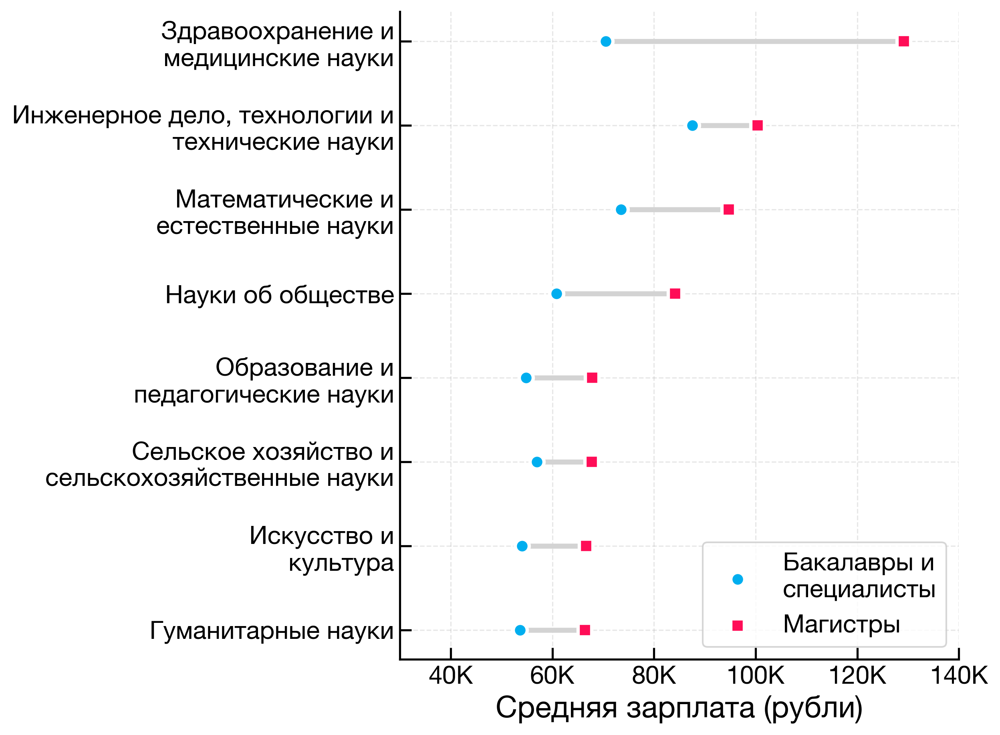

In [11]:
def salary_by_area_stat(df: pd.DataFrame):
    '''
    Объединяет выпускников в группы по направлению образования, счиатет
    медианную зарплату в каждой группе и количество выпускников в каждой группе.
    Размеры групп не должны быть слишком маленькими, чтобы метрики были
    статистически значимыми.

    Args:
        df (pd.DataFrame): _description_

    Returns:
        pd.DataFrame: Датафрейм с медианными зарплатами и размером групп
    '''    
    return pd.DataFrame(df.groupby('study_area').agg(
        average_salary=('average_salary', 'median'),
        group_size=('average_salary', 'count'))
        )

def bachelor_vs_master(
        bachelor_df: pd.DataFrame, master_df: pd.DataFrame, ax: plt.Axes,
        stat_func: Callable, no_med: bool = False, rightlim: float = 1.4e5
        ):

    # Получаем сгруппированные датафреймы
    bachelor_stat_df = stat_func(bachelor_df)
    master_stat_df = stat_func(master_df)

    # Объединяем их в один (по направлению образования)
    total_stat_df = bachelor_stat_df.merge(
        master_stat_df, on='study_area', how='left',
        suffixes=['_bachelor', '_master']
        ).sort_values(by='average_salary_master', ascending=False)
    
    if no_med:
        # Исключаем выпускников медицинских специальностей из рассмотрения
        total_stat_df = total_stat_df.query(
            'study_area != "Здравоохранение и медицинские науки"'
            )

    # Длинные названия специальностей разбиваем на несколько строк после союза "и"
    total_stat_df.index = [' и\n'.join(i.split(' и ')) for i in total_stat_df.index]
    total_stat_df.index.name = 'study_area'
    
    # Наносим кружки (зарплаты бакалавров/специалистов)
    sns.scatterplot(
        total_stat_df, x='average_salary_bachelor', y='study_area', s=70,
        ax=ax, zorder=5, color="#00AEEF", label='Бакалавры и\nспециалисты', lw=2
        )
    
    # Наносим квадраты (зарплаты магистров)
    sns.scatterplot(
        total_stat_df, x='average_salary_master', y='study_area', s=70,
        ax=ax, zorder=5, color='#ff0d57', label='Магистры', lw=2,
        marker='s'
        )
    
    # Наносим линии, которые соединяют кружки и квадраты и визуально подчеркивают
    # разницу в зарплате между категориями
    for area, row in total_stat_df.iterrows():
        ax.plot(
            (row.average_salary_bachelor, row.average_salary_master),
            (area, area), color='lightgray', lw=3
            )

    # Преобразуем подписи на горизонтальной оси, устанавливаем диапазон для нее,
    # настраиваем другие детали отображения графика
    ax.xaxis.set_major_formatter(plt.FuncFormatter(format_yticks))
    ax.set_xlim(3e4, rightlim)
    ax.grid(alpha=.3)
    ax.legend(loc='lower right')

    ax.set_xlabel('Средняя зарплата (рубли)')
    ax.set_ylabel('')

    return (bachelor_stat_df, master_stat_df, total_stat_df), ax

fig, ax = plt.subplots(figsize=(6, 7))
dfs, ax = bachelor_vs_master(
    fed_dist_bachelor_df, fed_dist_master_df, ax, stat_func=salary_by_area_stat
    )

Среднее значение для зарплаты магистров-медиков выглядит аномально большим. Комментарий Алены Манузиной (_«Если быть точным»_):

>Формально медицинская магистратура существует (направления есть в [перечне](https://base.garant.ru/70480868/f7ee959fd36b5699076b35abf4f52c5c/?ysclid=m017r6vprq81404464) и, например, [здесь](https://www.sechenov.ru/univers/structure/center/tsentr-magisterskikh-programm/mag/?ysclid=m017p97xpx668510986) — все, что с кодами на 32, 33 и 34). Другое дело, что __это подготовка скорее к управленческим позициям, поэтому на них идут уже взрослые и опытные люди (это единственная группа со средним возрастом выпускников 35+), отсюда и разница в зарплате между выпускниками бакалавриата/специалитета и магистратуры__. Плюс наборы очень маленькие — по данным Роструда это 100-200 человек на всю страну в разные годы, поэтому расчеты на основе этих данных и сопоставление с другими областями образования могут быть очень ненадежными.

<div class="alert alert-light" role="alert"> ⚠︎ Исключим выпускников медицинских специальностей из рассмотрения, поскольку данные об их зарплатах смещены </div>

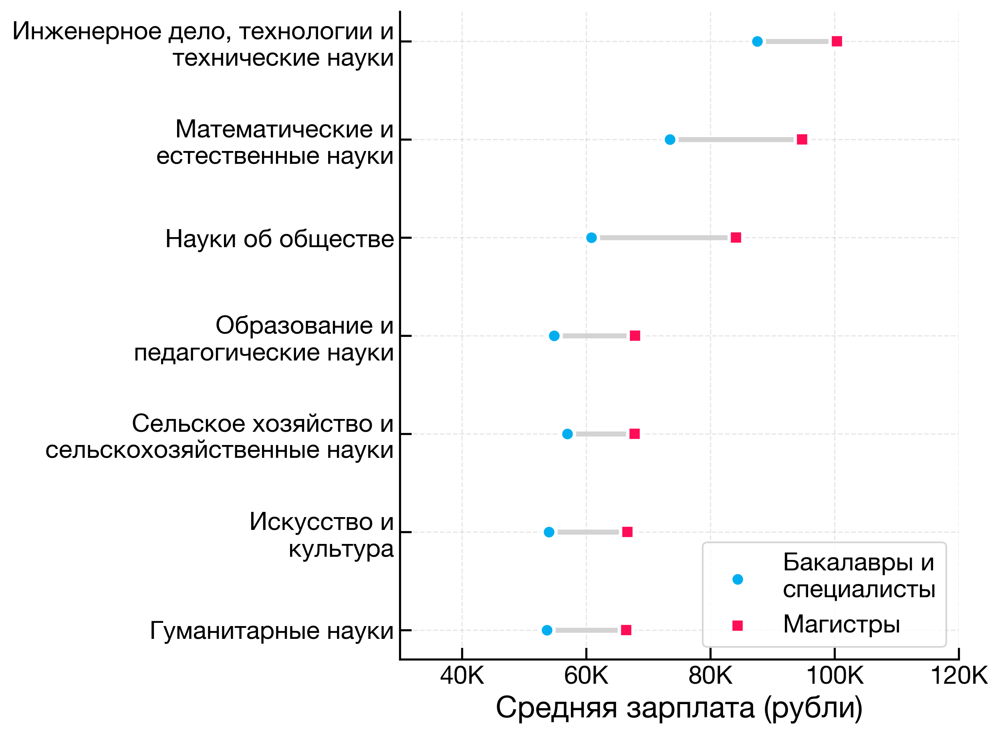

In [12]:
fig, ax = plt.subplots(figsize=(6, 7))

dfs, ax = bachelor_vs_master(
    fed_dist_bachelor_df, fed_dist_master_df,
    no_med=True, ax=ax, stat_func=salary_by_area_stat, rightlim=1.2e5
    )

- Больше всего в Росии в среднем зарабатывают выпускники инженерных и технических специальностей (в среднем от 90 до 100 тысяч рублей в месяц в зависимости от уровня образования)

- На втором месте выпускники математических и естественных наук (от 70 до 95 тысяч), на третьем — общественно-научных специальностей (от 60 до 83 тысяч)

- Выпускники педагогических, сельскохозяйственных, гуманитарных направлений и специальностей, связанных с искуством и культурой, получают примерно одинаково — около 60 тысяч рублей в месяц

Теперь обновим топы специальностей.

## Топ-3 специальностей по среднему размеру зарплат по федеральным округам

__Из выборки исключены данные о выпускниках медицинских специальностей.__

В топах по округам представлены выпускники следующих спецальностей:

<img src="./data/img/engineer.png" width="25"/> <font color="#1E88E5">инженерных и технических</font>

<img src="./data/img/nerd.png" width="25"/> <font color="#ff0d57">математических и естестеннонаучных</font>

<img src="./data/img/social.png" width="25"/> <font color="#FFC000">общественно-научных</font>

<img src="./data/img/rural.png" width="25"/> <font color="#7C52FF">сельскозозяйственных</font>

<img src="./data/img/books.png" width="25"/> <font color="#70b58c">педагогических</font>

<img src="./data/img/art.png" width="25"/> <font color="#00AEEF">искусство/культура</font>

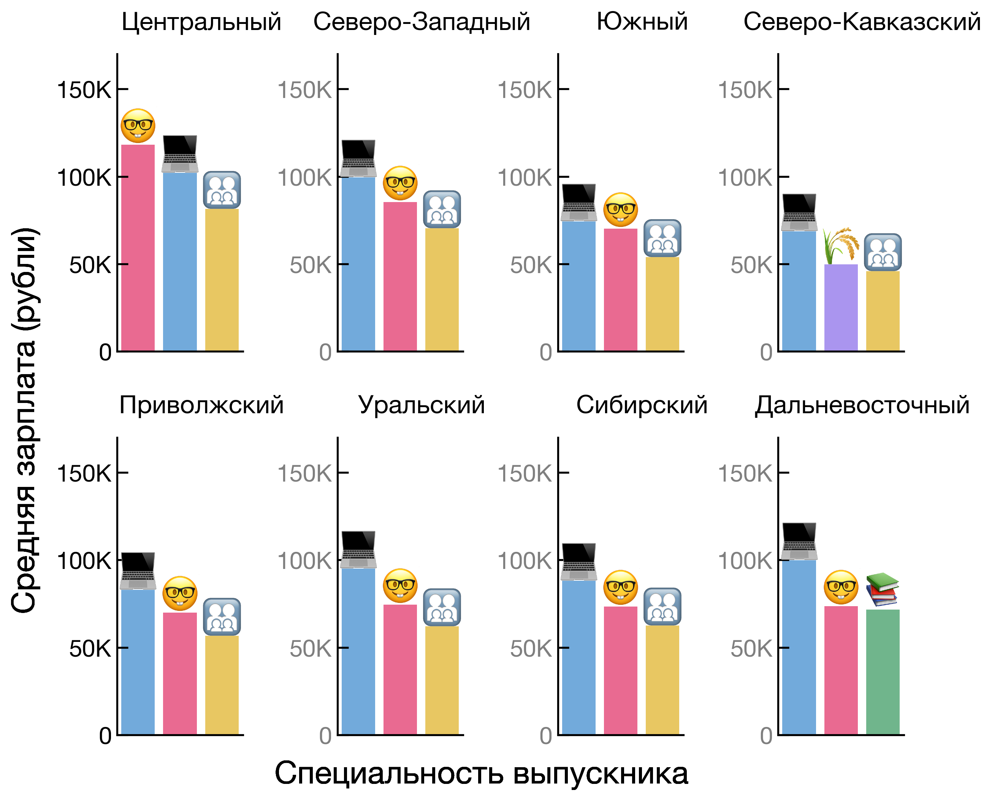

In [13]:
plot_top_salaries_by_fd(fed_dist_bachelor_df, no_med=True)

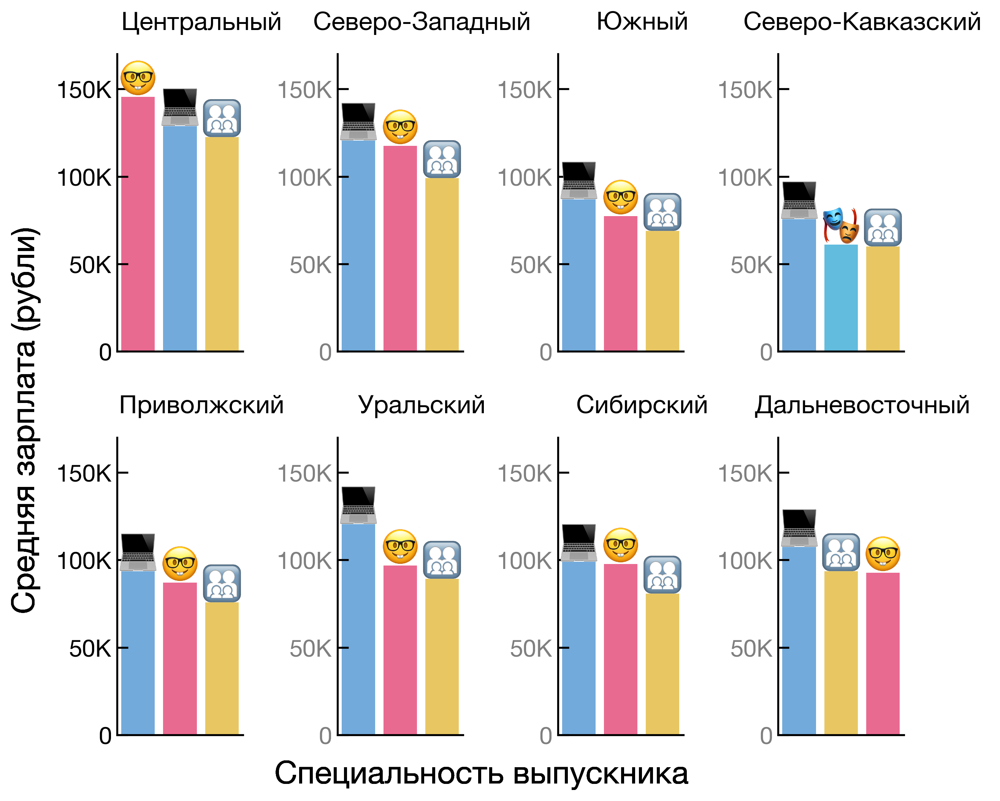

In [14]:
plot_top_salaries_by_fd(fed_dist_master_df, no_med=True)

Топ-3 специальностей по размеру зарплат в разных федеральных округах для выпускников магистратуры стал гораздо более похож на аналогичное распределение для выпускников бакалавриата/специалитета после исключения смещённых данных о выпускниках медицинских специальностей.

<span style="font-size: 20px;">cреди выпускников бакалавриата и специалитета</span>

- Только выпускники <img src="./data/img/engineer.png" width="20"/> <font color="#1E88E5">инженерных и технических</font> специальностей входят в топ-3 по среднему размеру зарплат во всех федеральных округах

- Только в Центральном округе выпускники <img src="./data/img/nerd.png" width="20"/> <font color="#ff0d57">математических и естестеннонаучных</font> специальностей получают больше остальных

<span style="font-size: 20px;">cреди выпускников магистратуры</span>

- Наиболее заметный рост зарплаты по отношению к выпускникам бакалавриата или специалитета наблюдается в Центральном и Северо-Западном федеральном округе

- Наименьший прирост зарплаты у магистров по сравнению с бакалаврами/специалистами наблюдается в Южном, Приволжском и Северо-Кавказском округах

***

## Как меняется зарплата выпускников в зависимости от количества лет с момента выпуска

<div class="alert alert-light" role="alert"> ⚠︎ Здесь мы не будем разделять данные по федеральным округам, так как размеры выборки ограничены. Нужно иметь в виду, что средние зарплаты в разных регионах отличаются. В данных содержится информация о зарплатах выпускников с 2019 по 2023 год. </div>

<font size="5"> Бакалавры и специалисты </font>

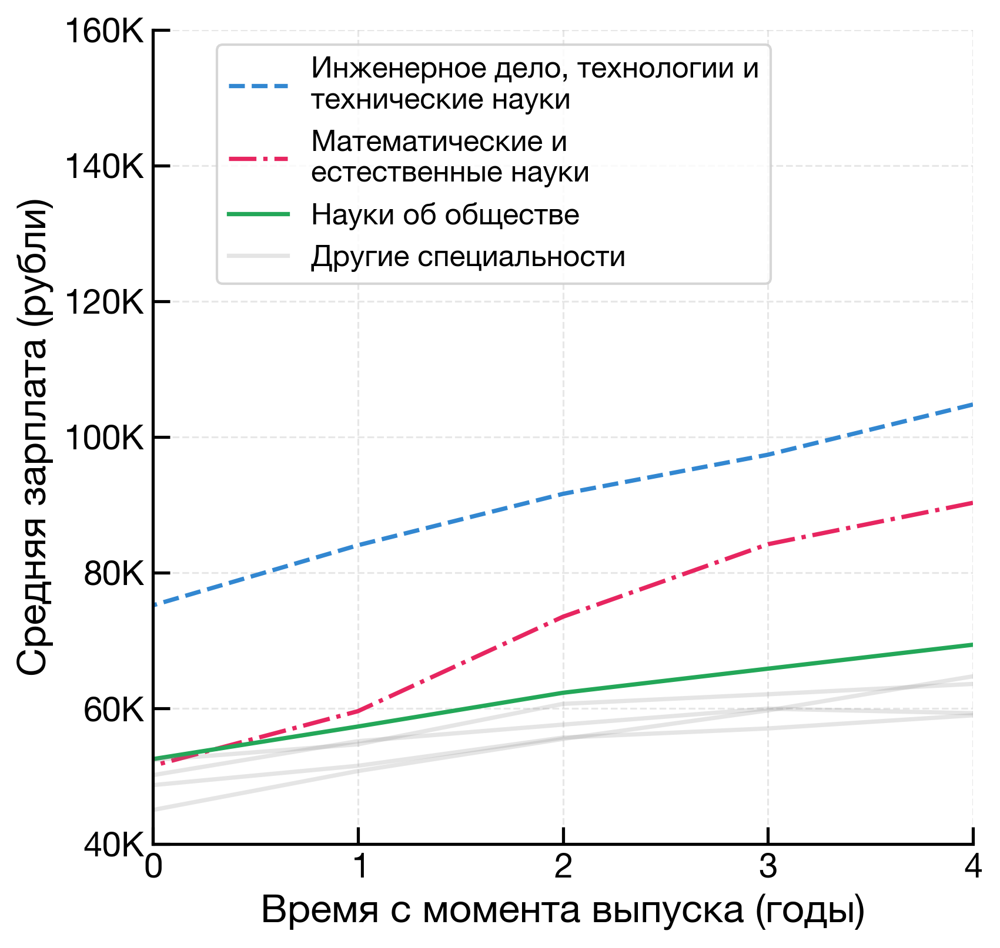

In [15]:
def plot_career_dynamics(df: pd.DataFrame):
    '''
    Строит линейный график, отражающий динамику изменения зарплат выпускников
    разных специальностей в зависимости от количества лет с момента выпуска

    Args:
        df (pd.DataFrame): Датафрейм с информацией о зарплатах

    Returns:
        plt.Axes: Линейный график
    '''    

    # Исключаем выпускников медицинских специальностей из рассмотрения
    df = df.query('study_area != "Здравоохранение и медицинские науки"')

    # Группируем данные по годам и специальностям, считаем медианную зарплату
    # в каждой группе и ее размер. Размеры групп не должны быть слишком маленькими,
    # чтобы метрики были статистически значимыми.
    grouped_df = df.groupby(['study_area', 'year']).agg(
        average_salary=('average_salary', 'median'),
        group_size=('average_salary', 'count')
    ).reset_index()

    # "Переворачиваем" датафрейм так, чтобы в строках были специальности,
    # а в столбцах — медианная зарплата по годам
    pivot_df = grouped_df.pivot_table(
        index='study_area',
        columns='year',
        values='average_salary'
    )

    # Переименовываем колонки
    pivot_df.columns = [abs(col - 2023) for col in pivot_df.columns]

    # Возвращаем 'study_area' в список колонок (выше она стала индексом)
    pivot_df = pivot_df.reset_index()

    pivot_df = pivot_df.set_index('study_area')

    _, ax = plt.subplots(figsize=(6, 6))

    areas_of_interest = [
        'Инженерное дело, технологии и технические науки',
        'Математические и естественные науки',
        'Науки об обществе'
    ]
    
    line_styles = ['--', '-.', '-']
    line_style_cycle = itertools.cycle(line_styles)
    
    for area in list(pivot_df.index):
        if area in areas_of_interest:
            area_label = ' и\n'.join(area.split(' и '))
            ax.plot(pivot_df.loc[area], label=area_label, ls=next(line_style_cycle))
        else:
            ax.plot(
                pivot_df.loc[area], color='gray', alpha=.2,
                label='Другие специальности'
                )

    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))

    # Задаем порядок отображения легенд
    desired_order = [
        'Инженерное дело, технологии и\nтехнические науки',
        'Математические и\nестественные науки',
        'Науки об обществе',
        'Другие специальности'
    ]

    # Меняем порядок отображения легенд, чтобы они соответствовали порядку
    # отображения линий сверху вниз (упрощает восприятие)
    ordered_handles = [unique[label] for label in desired_order if label in unique]
    ordered_labels = [label for label in desired_order if label in unique]
    ax.legend(
        ordered_handles, ordered_labels, fontsize=12,
        loc='upper left', bbox_to_anchor=(0.06, 1)
        )
    ax.yaxis.set_major_formatter(plt.FuncFormatter(format_yticks))

    ax.tick_params(axis='both', which='major', labelsize=14)

    ax.grid(alpha=.3)
    ax.set_xlabel('Время с момента выпуска (годы)', fontsize=16)
    ax.set_ylabel('Средняя зарплата (рубли)', fontsize=16)
    ax.set_xlim(0, 4)
    ax.set_ylim(40e3, 160e3)

    return pivot_df

_ = plot_career_dynamics(fed_dist_bachelor_df)

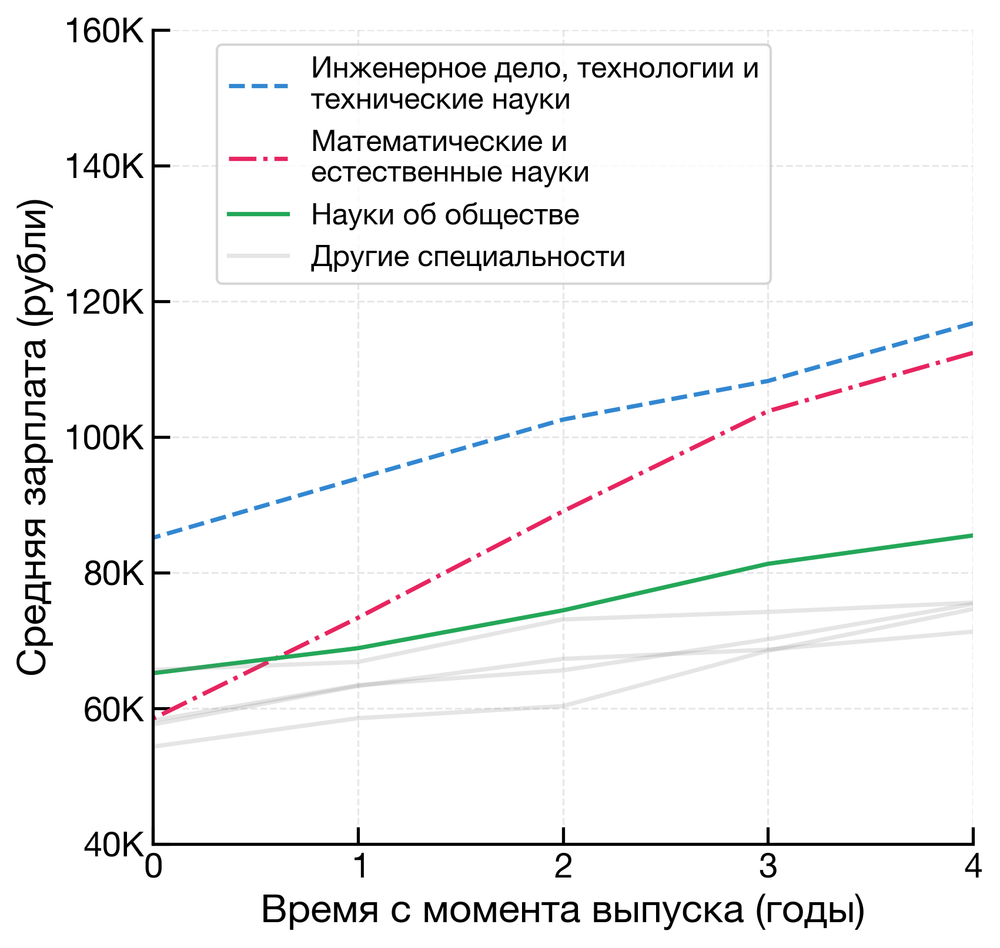

In [16]:
male_bahelor_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Бакалавриат, специалитет" &'
    'gender == "Мужской"'
    )

_ = plot_career_dynamics(male_bahelor_df)

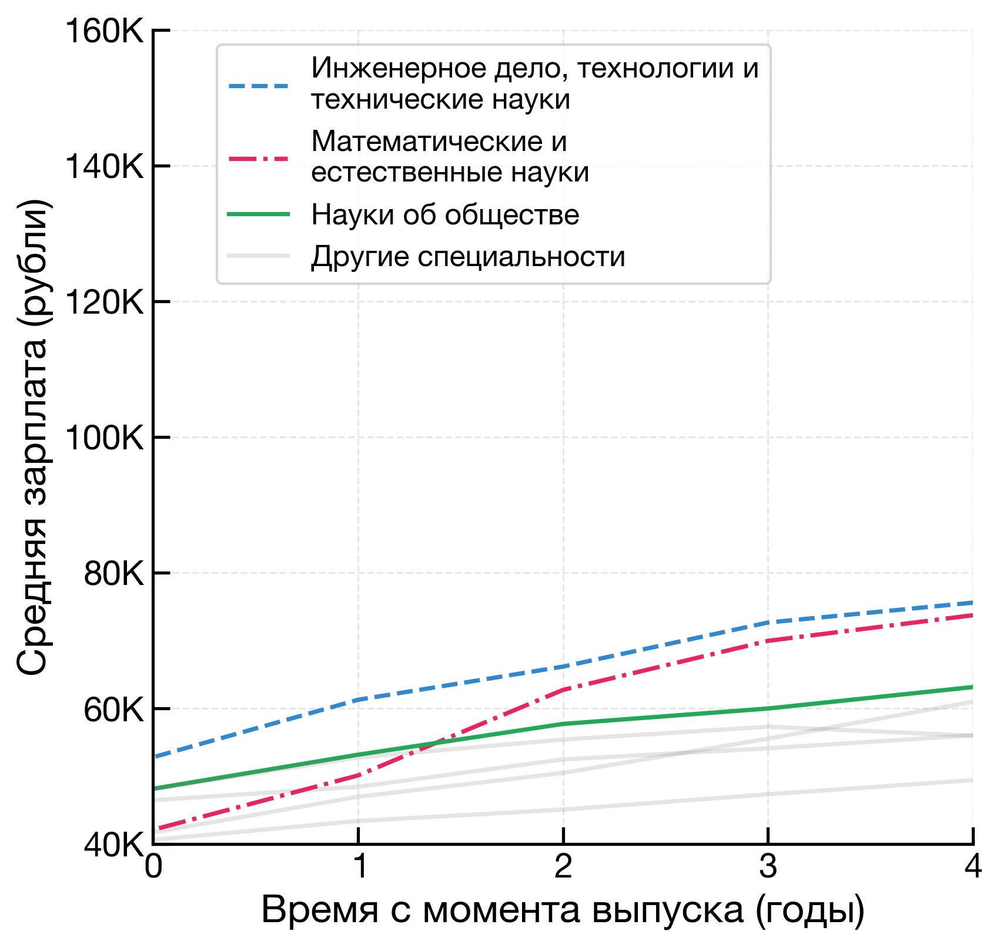

In [17]:
fem_bahelor_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Бакалавриат, специалитет" &'
    'gender == "Женский"'
    )

_ = plot_career_dynamics(fem_bahelor_df)

<font size="5"> Магистры </font>

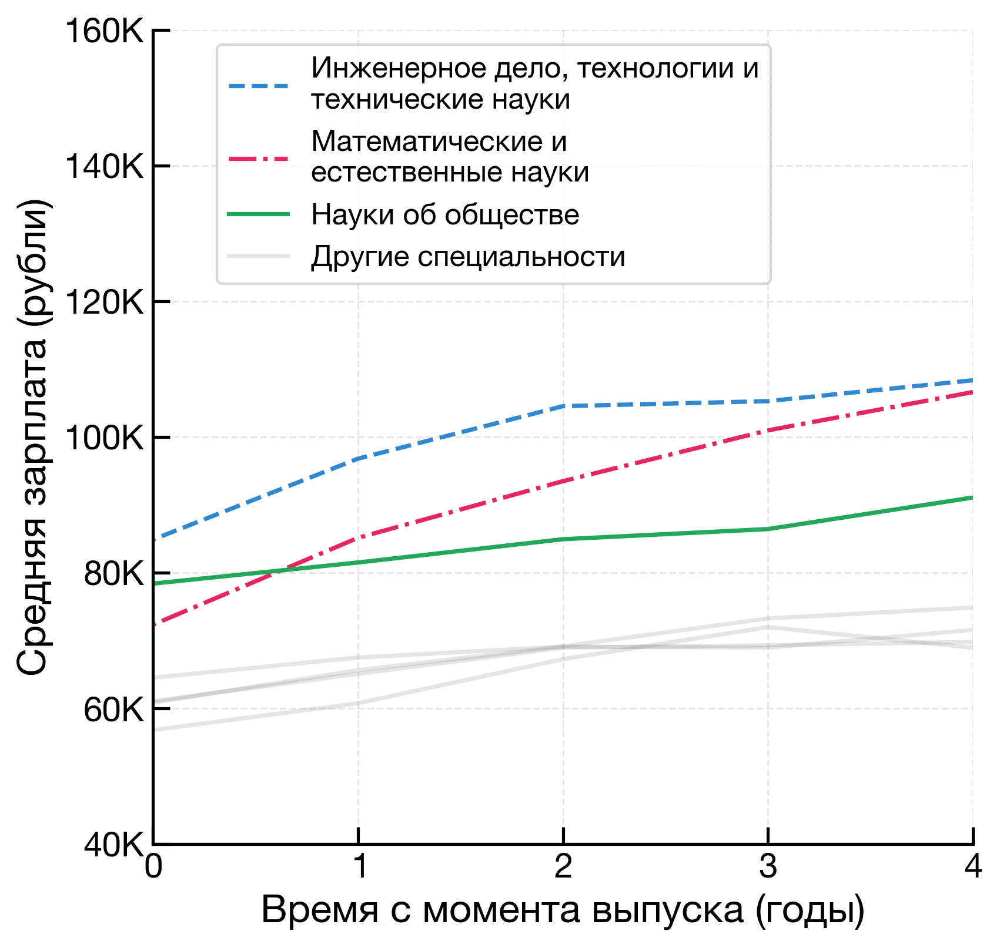

In [18]:
_ = plot_career_dynamics(fed_dist_master_df)

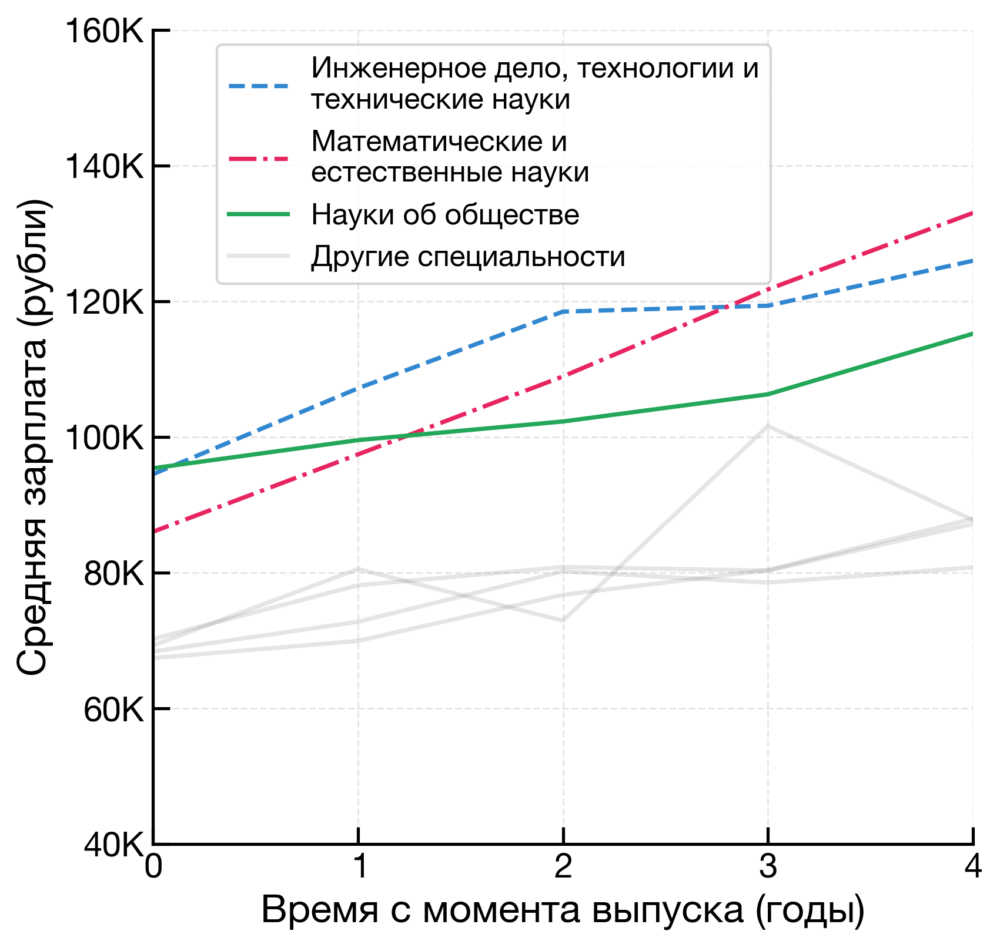

In [19]:
male_master_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Магистратура" &'
    'gender == "Мужской"'
    )

_ = plot_career_dynamics(male_master_df)

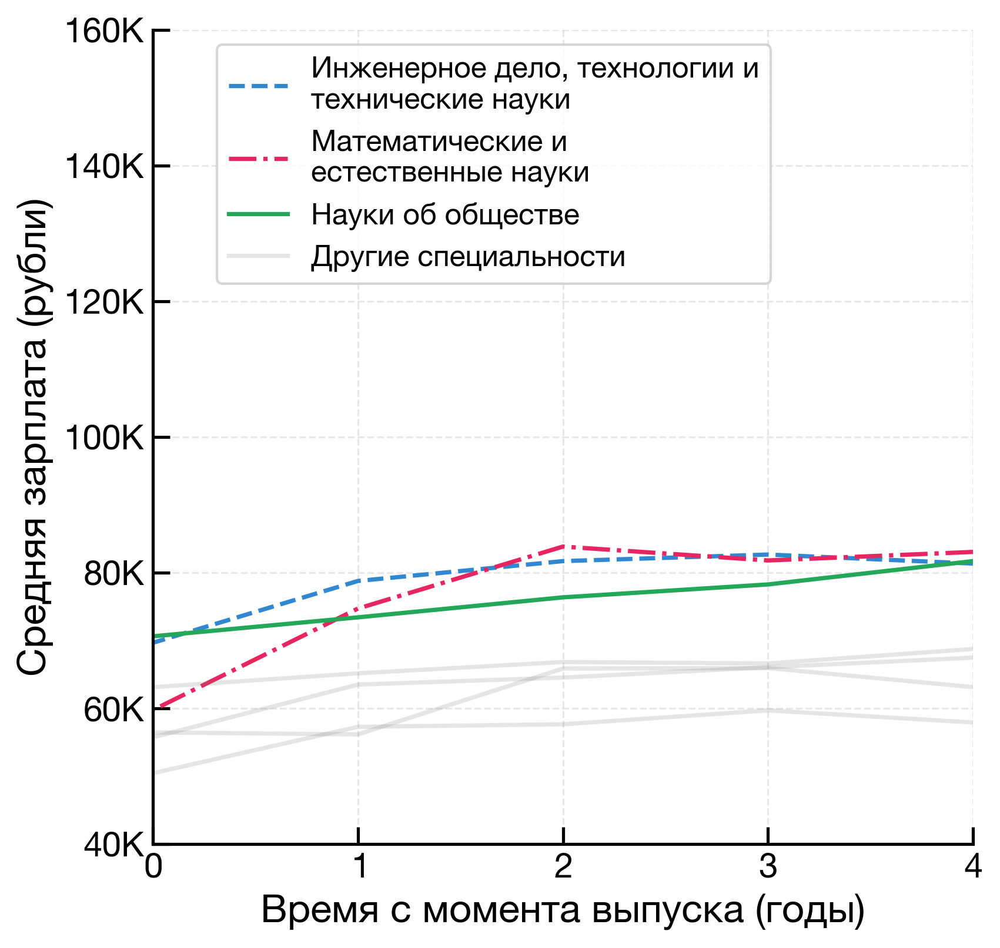

In [20]:
fem_master_df = smaller_df.query(
    'object_level == "Федеральный округ" &'
    'education_level == "Магистратура" &'
    'gender == "Женский"'
    )

_ = plot_career_dynamics(fem_master_df)

- Независимо от уровня образования, специализации и времени с момента выпуска средняя зарплата для женщин в целом по стране не превшает ~80 тысяч рублей в месяц, примерно после двух лет с момента выпуска она перестаёт расти

- Для мужчин зарплаты продолжают расти на протяжении как минимум четырех лет с момента выпуска и для наиболее востребованных специальностей превышают 120 тысяч рублей в месяц

***

## Выводы

Больше всего в Росии в среднем зарабатывают выпускники:

1. Инженерных и технических специальностей (в среднем от 90 до 100 тысяч рублей в месяц в зависимости от уровня образования)
2. Математических и естественных наук (от 70 до 95 тысяч)
3. Общественно-научных специальностей (от 60 до 83 тысяч)

Выпускники педагогических, сельскохозяйственных, гуманитарных направлений и специальностей, связанных с искуством и культурой, получают примерно одинаково — около 60 тысяч рублей в месяц. Размеры зарплат отличаются в зависимости от округа, но качественная картина сохраняется. Выпускники медицинских специальностей не учитывались при анализе, поскольку информация об их зарплате частично отсутствует, а частично сильно смещена.

Независимо от уровня образования, специализации и времени с момента выпуска средняя зарплата для женщин в целом по стране не превшает ~80 тысяч рублей в месяц, примерно после двух лет с момента выпуска она перестаёт расти. Для мужчин зарплаты продолжают расти на протяжении как минимум четырех лет с момента выпуска и для наиболее востребованных специальностей превышают 120 тысяч рублей в месяц.

<!-- <font color="gray">

- ~~Есть ли разница между зарплатами магистров и баколавров/специалистов?~~

- Нужно ли нанести долю занятых на карту?

- ~~Отобразить прирост зарплат на графике образовательная категория - изменение~~

- ~~Проявляются ли гендерные различия?~~

- Подстроить шрифт под Кварто -->